<a href="https://colab.research.google.com/github/JuliPolu/Computer_Vision_Course_Otus/blob/main/CV_6_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Домашнее задание: Object Detection (train)

Обучить object detection модель из [Detectron2](https://github.com/facebookresearch/detectron2) детектировать игроков в баскетбольном матче. Число классов: 2 (две команды).

В качестве модели следует взять одну из [предобученных моделей](https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md) (Faster R-CNN или RetinaNet).

Пример того, как обучать Detectron2 на своем датасете можно найти [здесь](https://colab.research.google.com/drive/1Xdm2KrBauT0lEyKFEiLie7nhzXajgEkH?usp=sharing).

### Датасет:
Скачайте датасет [otus_basketball_dataset](https://drive.google.com/file/d/1hbVuyL3UJPDP6VE0F6aZ3fSVy4wXCsVS/view?usp=drive_link) и распакуйте. Внутри находятся папки `images_train` (400 изображений) и `images_test` (100 изображений), а также файлы с аннотациями к ним: `anno_train.json` и `anno_test.json`. Файлы с аннотациями имеет следующую структуру:
```
image_name: {
     player_id: {
             'box': [x,y,w,h],
             'team': int
     }
     .....
}
....
```
Здесь `image_name` - имя изображения в соответствующей папке,<br>
`player_id` - id игрока в текущем изображении (в данном задании id не важен),<br>
`'box': [x,y,w,h]` - bounding box соответствующего игрока (координаты нормализованы от 0 до 1, поэтому их нужно домножить на размеры изображения, чтобы перевести их в целые координаты фрейма),<br>
`'team': int` - id команды к которой принадлежит игрок  в данном кадре (может принимать значения 0 или 1).


### Задачи:
1) Адаптировать датасет к внутреннему формату датасетов Detectron2 и обучить модель.

2) Посчитать метрику COCO mAP (можно использовать любую готовую библиотеку).

3) [Опционально] Реализовать вручную вычисление метрики IoU для предсказанных боксов и ground truth.

4) [Опционально] Реализовать вручную вычисление Precision и Recall и построить Precision-Recall кривую.

### Баллы:
+3 балл за пункты 1 и 2<br>
+1 балл за выполнение пункта 3<br>
+1 балл за выполнение пункта 4<br>

## ВЫПОЛНЕНИЕ ЗАДАНИЯ

In [ ]:
# Новый вариант:
!python3 -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-iuxg1hwk
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-iuxg1hwk
  Resolved https://github.com/facebookresearch/detectron2.git to commit cc9266c2396d5545315e3601027ba4bc28e8c95b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 45.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 15.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6147632 sha256=6e98e3c57d184078c7bbcab9dd06

In [ ]:
# check pytorch installation:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
#assert torch.__version__.startswith("1.10")   # please manually install torch 1.10 if Colab changes its default version

2.2.1+cu121 True


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# set up view:
%matplotlib inline
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [40, 20]

## Подготовка датасета

In [ ]:
# Скачаем и распакуем данные
from google.colab import drive

drive.mount('/content/drive')

! unzip 'drive/My Drive/Colab Notebooks/CV_OTUS/Lesson_8_Detection_1/otus_basketball_dataset_v2.zip' -d /content/


In [ ]:
# # Если используется датасет в формате COCO, то эту ячейку кода нужно заменить всего на 3 строки:
# # from detectron2.data.datasets import register_coco_instances
# # register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# # register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

# from detectron2.structures import BoxMode

# def get_basketball_dicts(json_file, img_dir):
#     json_file = os.path.join(img_dir, f"anno_{mode}.json")
#     with open(json_file) as f:
#         imgs_anns = json.load(f)

#     dataset_dicts = []
#     for idx, v in enumerate(imgs_anns.values()):
#         record = {}

#         filename = os.path.join(img_dir, f"images_{mode}",  v["filename"])
#         height, width = cv2.imread(filename).shape[:2]

#         record["file_name"] = filename
#         record["image_id"] = idx
#         record["height"] = height
#         record["width"] = width

#         annos = v["regions"]
#         objs = []
#         for _, anno in annos.items():
#             assert not anno["region_attributes"]
#             anno = anno["shape_attributes"]
#             px = anno["all_points_x"]
#             py = anno["all_points_y"]
#             poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
#             poly = [p for x in poly for p in x]

#             obj = {
#                 "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
#                 "bbox_mode": BoxMode.XYXY_ABS,
#                 # "segmentation": [poly],
#                 "category_id": 0,
#             }
#             objs.append(obj)
#         record["annotations"] = objs
#         dataset_dicts.append(record)
#     return dataset_dicts

# for d in ["train", "val"]:
#     DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
#     MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
# balloon_metadata = MetadataCatalog.get("balloon_train")

In [ ]:
from detectron2.structures import BoxMode

def get_basketball_dicts(json_file, img_dir):
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, (filename, annotations) in enumerate(imgs_anns.items()):
        record = {}

        file_path = os.path.join(img_dir, filename)
        height, width = cv2.imread(file_path).shape[:2]

        record["file_name"] = file_path
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        objs = []
        for anno_id, anno in annotations.items():
            bbox = anno['box']
            bbox_abs = [bbox[0] * width, bbox[1] * height, bbox[2] * width, bbox[3] * height]

            obj = {
                "bbox": [bbox_abs[0], bbox_abs[1], bbox_abs[0] + bbox_abs[2], bbox_abs[1] + bbox_abs[3]],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": anno['team'],
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

# Replace these paths with your actual file paths
json_file_train = '/content/otus_basketball_dataset_v2/anno_train.json'
img_dir_train = '/content/otus_basketball_dataset_v2/images_train'
json_file_test = '/content/otus_basketball_dataset_v2/anno_test.json'
img_dir_test = '/content/otus_basketball_dataset_v2/images_test'

# # Registering the datasets
DatasetCatalog.register("basketball_train", lambda: get_basketball_dicts(json_file_train, img_dir_train))
MetadataCatalog.get("basketball_train").set(thing_classes=["team0", "team1"])

DatasetCatalog.register("basketball_test", lambda: get_basketball_dicts(json_file_test, img_dir_test))
MetadataCatalog.get("basketball_test").set(thing_classes=["team0", "team1"])
basketball_metadata = MetadataCatalog.get("basketball_train")

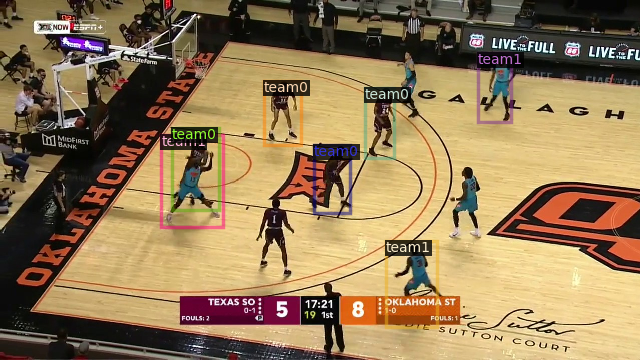

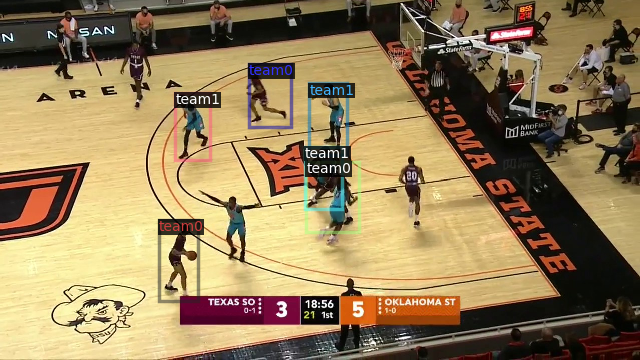

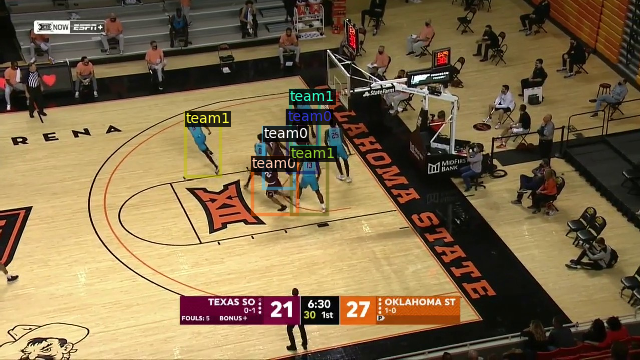

In [ ]:
dataset_dicts = get_basketball_dicts(json_file_train, img_dir_train)
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=basketball_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Обучение

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("basketball_train",)
cfg.DATASETS.TEST = ("basketball_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.005  # pick a good LR
cfg.SOLVER.MAX_ITER = 600    #
# Step LR Scheduler
cfg.SOLVER.STEPS = (300,)  # Decrease the learning rate at these iterations.
cfg.SOLVER.GAMMA = 0.1           # Learning rate is multiplied by GAMMA at each step.
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/17 18:03:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_f97cb7.pkl: 136MB [00:00, 179MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[03/17 18:03:39 d2.engine.train_loop]: Starting training from iteration 0
[03/17 18:04:04 d2.utils.events]:  eta: 0:11:13  iter: 19  total_loss: 2.461  loss_cls: 1.44  loss_box_reg: 0.8417  loss_rpn_cls: 0.1388  loss_rpn_loc: 0.02563    time: 1.1679  last_time: 1.1881  data_time: 0.0570  last_data_time: 0.0528   lr: 2.0675e-05  max_mem: 7373M
[03/17 18:04:28 d2.utils.events]:  eta: 0:11:14  iter: 39  total_loss: 2.125  loss_cls: 1.151  loss_box_reg: 0.8459  loss_rpn_cls: 0.1197  loss_rpn_loc: 0.02511    time: 1.2049  last_time: 1.2316  data_time: 0.0502  last_data_time: 0.0252   lr: 3.7175e-05  max_mem: 7373M
[03/17 18:04:54 d2.utils.events]:  eta: 0:11:01  iter: 59  total_loss: 1.785  loss_cls: 0.8024  loss_box_reg: 0.8431  loss_rpn_cls: 0.1051  loss_rpn_loc: 0.02149    time: 1.2239  last_time: 1.2169  data_time: 0.0507  last_data_time: 0.0292   lr: 5.3675e-05  max_mem: 7373M
[03/17 18:05:18 d2.utils.events]:  eta: 0:10:34  iter: 79  total_loss: 1.547  loss_cls: 0.6185  loss_box_reg: 

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10507), started 0:35:03 ago. (Use '!kill 10507' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Сохраним обученную модель:
! cp './output/model_final.pth' 'drive/My Drive/Colab Notebooks/CV_OTUS/Lesson_8_Detection_1/model_final.pt'

## Инференс и оценка обученной модели
Теперь можно протестировать обученную модель на валидационном сете "balloon". Сперва создадим предиктор для только что обученной модели:

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/17 18:16:05 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Далее, выберем несколько случайных семплов и визуализируем результаты предсказаний.

tensor([0, 0, 1, 1, 0, 0], device='cuda:0')
tensor([0, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
tensor([0, 1, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


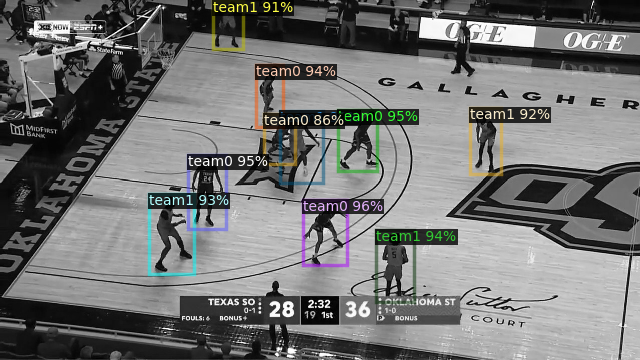

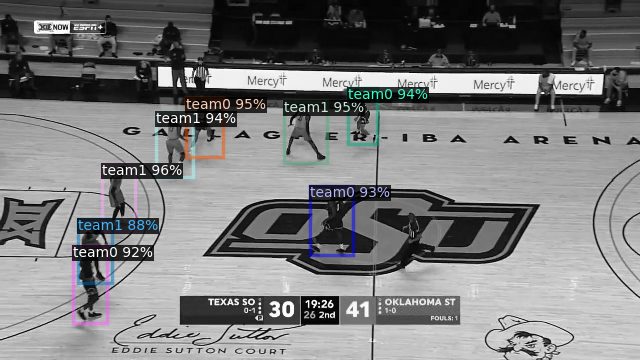

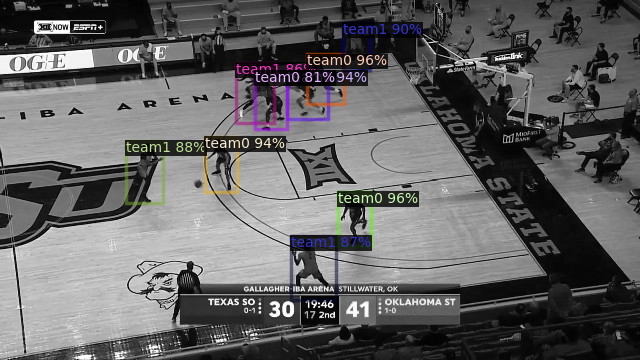

In [ ]:
from detectron2.utils.visualizer import Visualizer, ColorMode
import random

dataset_dicts = get_basketball_dicts(json_file_test, img_dir_test)
basketball_metadata = MetadataCatalog.get("basketball_train")

for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    # Check the class indices in the predictions
    pred_classes = outputs["instances"].pred_classes
    print(pred_classes)

for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=basketball_metadata, scale=0.5, instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


Также, мы можем оценить производительность модели используя AP метрику, реализованную в COCO API.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("basketball_test", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "basketball_test")

print(inference_on_dataset(predictor.model, test_loader, evaluator))

WARNING [03/17 18:16:10 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/17 18:16:12 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/17 18:16:12 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/17 18:16:12 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[03/17 18:16:12 d2.data.common]: Serialized dataset takes 0.05 MiB
[03/17 18:16:12 d2.evaluation.evaluator]: Start inference on 100 batches
[03/17 18:16:17 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0019 s/iter. Inference: 0.4421 s/iter. Eval: 0.0004 s/iter. Total: 0.4444 s/iter. ETA=0:00:39
[03/17 18:16:23 d2.evaluation.evaluator]: Inference done 23/100. Dataloading: 0.0025 s/iter. Inference: 0.4425 s/i

## 3) [Опционально] Реализовать вручную вычисление метрики IoU для предсказанных боксов и ground truth.


In [ ]:
def calculate_iou(box1, box2):
    # Вычисляем координаты пересечения рамок
    x_min_inter = max(box1[0], box2[0])
    y_min_inter = max(box1[1], box2[1])
    x_max_inter = min(box1[2], box2[2])
    y_max_inter = min(box1[3], box2[3])

    # Вычисляем площадь пересечения
    inter_area = max(0, x_max_inter - x_min_inter) * max(0, y_max_inter - y_min_inter)

    # Вычисляем площадь каждой рамки
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Вычисляем площадь объединения рамок
    union_area = box1_area + box2_area - inter_area

    # Вычисляем IoU
    iou = inter_area / union_area

    return iou


In [ ]:
from detectron2.utils.visualizer import ColorMode
import detectron2.data.transforms as T

# Предполагается, что cfg уже настроен для вашей модели
predictor = DefaultPredictor(cfg)

def get_iou_scores(dataset_dicts, predictor, iou_function):
    iou_scores = []
    for item in dataset_dicts:
        image = cv2.imread(item["file_name"])
        outputs = predictor(image)

        # Предсказанные рамки
        pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()

        # Истинные рамки
        gt_boxes = [anno["bbox"] for anno in item["annotations"]]

        # Вычисление IoU для каждой пары предсказанной и истинной рамки
        for gt_box in gt_boxes:
            for pred_box in pred_boxes:
                iou_score = iou_function(gt_box, pred_box)
                iou_scores.append(iou_score)

    return iou_scores

# Загрузка тестовых данных
test_dataset = DatasetCatalog.get("basketball_test")

# Вычисление IoU
iou_scores = get_iou_scores(test_dataset, predictor, calculate_iou)

#рассчитать среднее значение
average_iou = sum(iou_scores) / len(iou_scores)
print(f"Среднее IoU: {average_iou}")


[03/17 18:16:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
Среднее IoU: 0.09788049483045848


## 4) [Опционально] Реализовать вручную вычисление Precision и Recall и построить Precision-Recall кривую.

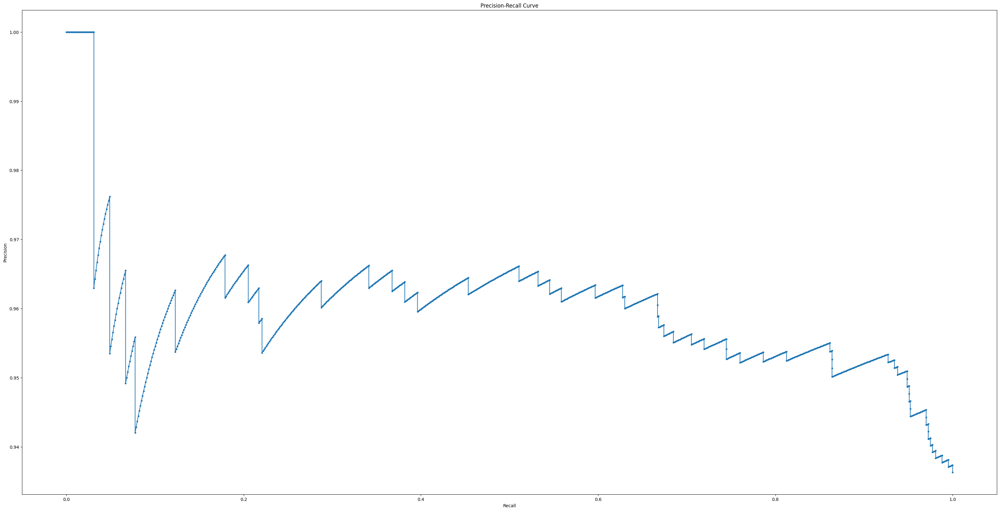

In [ ]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
import numpy as np

def get_predictions_and_gt_boxes(dataset_dicts, predictor):
    all_gt_boxes = []
    all_pred_boxes = []
    all_scores = [] # Вероятности для предсказанных рамок

    for item in dataset_dicts:
        image = cv2.imread(item["file_name"])
        outputs = predictor(image)

        # Предсказанные рамки и вероятности
        pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
        scores = outputs["instances"].scores.cpu().numpy()

        # Истинные рамки
        gt_boxes = [anno["bbox"] for anno in item["annotations"]]

        all_gt_boxes.append(gt_boxes)
        all_pred_boxes.extend(pred_boxes)
        all_scores.extend(scores)

    return all_gt_boxes, all_pred_boxes, all_scores

# Получаем предсказания и истинные данные
all_gt_boxes, all_pred_boxes, all_scores = get_predictions_and_gt_boxes(test_dataset, predictor)

def get_y_true_y_scores(all_gt_boxes, all_pred_boxes, all_scores, iou_threshold):
    y_true = []
    y_scores = []

    # Обходим каждую пару предсказанной рамки и набора истинных рамок
    for pred_box, score in zip(all_pred_boxes, all_scores):
        matched = False
        for gt_boxes in all_gt_boxes:
            for gt_box in gt_boxes:
                if calculate_iou(pred_box, gt_box) >= iou_threshold:
                    matched = True
                    break
            if matched:
                break
        y_true.append(1 if matched else 0)
        y_scores.append(score)

    return y_true, y_scores

# Параметры
iou_threshold = 0.5

# Получаем y_true и y_scores
y_true, y_scores = get_y_true_y_scores(all_gt_boxes, all_pred_boxes, all_scores, iou_threshold)

precision, recall, thresholds = precision_recall_curve(y_true, y_scores)

# Построение Precision-Recall кривой
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()
